In [1]:
from nmon import *

 /Users/nikolaygusarov/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py: 34

tmon [-0.03447352  0.7058225   0.7402709   2.84958485  2.84960997  6.40722721]
nmon [-0.03447352+0.j  0.7058225 +0.j  0.7402709 +0.j  2.84958485+0.j
  2.84960997+0.j  6.40722721+0.j]


 /Users/nikolaygusarov/Library/Python/3.9/lib/python/site-packages/matplotlib/cbook.py: 1345

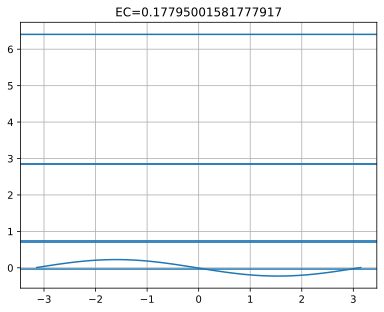

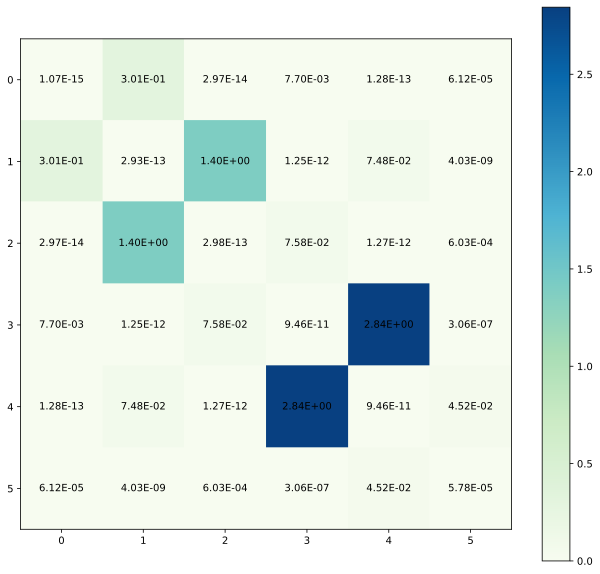

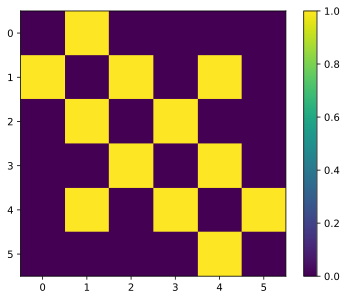

In [10]:
N = 1
M = 1
EC_shunt = 0.18 * 1

nmon = Nmon(N=N, M=M, EJN=20*EC_shunt, EJM=20*EC_shunt, EC_shunt=EC_shunt)

nmon.hamiltonian_calc(flux=0.49, ng=[0.0], num_levels=6, make_plot=True, cutoff=30)

# nmon.H = nmon.nmon_circ.hamiltonian()#.toarray() # sparse array
# nmon.evals, nmon.evecs = spla.eigsh(nmon.H, k=6, which='SA')
# nmon.H.shape


In [1]:
from nmon import *

EC_shunt = 0.18

N = 1
M = 1

N_EJN = 40
N_EJM = 40
N_flux = 5

flux_list = np.linspace(0, 0.5, N_flux)
EJM_list = np.linspace(1 * EC_shunt, 100 * EC_shunt, N_EJN)
EJN_list = np.linspace(1 * EC_shunt, 100 * EC_shunt, N_EJM)

# Generate all combinations of ng values
ng_probes = [0, 0.25, 0.5, 0.75]
ng_combinations = np.array(list(combinations_with_replacement(ng_probes, N + M - 1)))

relative_anharm_list = np.zeros((N_EJM, N_EJN, N_flux))
w01_list = np.zeros((N_EJM, N_EJN, N_flux))
w12_list = np.zeros((N_EJM, N_EJN, N_flux))
w01_variation_list = np.zeros_like(w01_list)

# To store the ng values corresponding to min and max w01
w01_ng_min = np.empty((N_EJM, N_EJN, N_flux), dtype=object)
w01_ng_max = np.empty((N_EJM, N_EJN, N_flux), dtype=object)

for i in range(N_EJM):
    for j in tqdm(range(N_EJN)):
        nmon = Nmon(N=N, M=M, EJM=EJM_list[i], EJN=EJN_list[j], EC_shunt=EC_shunt)
        for k, flux in enumerate(flux_list):

            w01_local = []
            local_ng_values = []

            # Iterate over all ng combinations
            for ng in ng_combinations:
                try:
                    nmon.hamiltonian_calc(flux=flux, ng=ng, num_levels=6, make_plot=False, just_H=False,
                                        cutoff=31)
                except Exception:
                    continue

                # Store w01 for the current ng
                w01_local.append(nmon.transition_freqs[0])
                local_ng_values.append(tuple(ng))

                if len(nmon.transition_freqs) > 1:
                    w12_list[i, j, k] = nmon.transition_freqs[1]

            # Compute relative anharmonicity
            relative_anharm_list[i, j, k] = nmon.relative_anharm
            w01_list[i, j, k] = np.min(w01_local)  # Store the minimal w01 for any ng configuration

            # Calculate w01 variation and store ng values for min and max w01
            max_idx = np.argmax(w01_local)
            min_idx = np.argmin(w01_local)

            w01_variation_list[i, j, k] = (w01_local[max_idx] - w01_local[min_idx]) / w01_local[min_idx]
            w01_ng_min[i, j, k] = local_ng_values[min_idx]
            w01_ng_max[i, j, k] = local_ng_values[max_idx]

# At the end, w01_ng_min and w01_ng_max store the ng values for which w01 is minimal or maximal.
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJM_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJN_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), flux_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), relative_anharm_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_variation_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_ng_max.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_ng_max)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_ng_min.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_ng_min)



  0%|          | 0/20 [00:00<?, ?it/s]

list index out of range
0.18 0.18 0.18 0.5 [5.33739719088544e-14] [0.17989638 0.17989638 1.61906742 1.61906742 4.49740949 4.49740949]



  5%|▌         | 1/20 [00:10<03:21, 10.62s/it]

list index out of range
0.18 1.1178947368421053 1.1178947368421053 0.5 [4.876932191422156e-13] [0.17935839 0.17935839 1.61422549 1.61422549 4.4839597  4.4839597 ]



 10%|█         | 2/20 [00:20<03:07, 10.44s/it]

list index out of range
0.18 2.0557894736842104 2.0557894736842104 0.5 [7.729927808952652e-14] [0.1788236  0.1788236  1.60941244 1.60941244 4.47059011 4.47059011]



 15%|█▌        | 3/20 [00:31<03:00, 10.63s/it]

list index out of range
0.18 2.993684210526316 2.993684210526316 0.5 [6.167288901792745e-14] [0.178292 0.178292 1.604628 1.604628 4.4573   4.4573  ]



 20%|██        | 4/20 [00:42<02:52, 10.80s/it]

list index out of range
0.18 3.931578947368421 3.931578947368421 0.5 [3.880229471064922e-14] [0.17776355 0.17776355 1.59987193 1.59987193 4.44408869 4.44408869]



 25%|██▌       | 5/20 [00:54<02:47, 11.18s/it]

list index out of range
0.18 4.869473684210526 4.869473684210526 0.5 [4.4614312244561916e-13] [0.17723822 0.17723822 1.59514396 1.59514396 4.43095545 4.43095545]



 30%|███       | 6/20 [01:05<02:36, 11.18s/it]

list index out of range
0.18 5.807368421052631 5.807368421052631 0.5 [4.3079428913017637e-13] [0.17671598 0.17671598 1.59044386 1.59044386 4.41789961 4.41789961]



 35%|███▌      | 7/20 [01:16<02:24, 11.13s/it]

list index out of range
0.18 6.745263157894736 6.745263157894736 0.5 [2.933764342571976e-14] [0.17619682 0.17619682 1.58577138 1.58577138 4.40492049 4.40492049]



 40%|████      | 8/20 [01:28<02:13, 11.14s/it]

list index out of range
0.18 7.6831578947368415 7.6831578947368415 0.5 [3.250177904590146e-14] [0.1756807  0.1756807  1.58112626 1.58112626 4.3920174  4.3920174 ]



 45%|████▌     | 9/20 [01:39<02:03, 11.20s/it]

list index out of range
0.18 8.621052631578946 8.621052631578946 0.5 [1.6026069360464135e-13] [0.17516759 0.17516759 1.57650829 1.57650829 4.37918968 4.37918968]



 50%|█████     | 10/20 [01:51<01:53, 11.34s/it]

list index out of range
0.18 9.558947368421052 9.558947368421052 0.5 [1.607047828144914e-14] [0.17465747 0.17465747 1.5719172  1.5719172  4.36643668 4.36643668]



 55%|█████▌    | 11/20 [02:02<01:43, 11.45s/it]

list index out of range
0.18 10.496842105263157 10.496842105263157 0.5 [4.791722574282176e-13] [0.17415031 0.17415031 1.56735278 1.56735278 4.35375774 4.35375774]



 60%|██████    | 12/20 [02:13<01:30, 11.37s/it]

list index out of range
0.18 11.434736842105263 11.434736842105263 0.5 [5.375422329478852e-13] [0.17364609 0.17364609 1.5628148  1.5628148  4.34115221 4.34115221]



 65%|██████▌   | 13/20 [02:25<01:20, 11.47s/it]

list index out of range
0.18 12.372631578947368 12.372631578947368 0.5 [4.773959005888173e-14] [0.17314478 0.17314478 1.55830301 1.55830301 4.32861948 4.32861948]



 70%|███████   | 14/20 [02:37<01:09, 11.63s/it]

list index out of range
0.18 13.310526315789472 13.310526315789472 0.5 [5.839773109528323e-14] [0.17264636 0.17264636 1.5538172  1.5538172  4.31615889 4.31615889]



 75%|███████▌  | 15/20 [02:48<00:56, 11.30s/it]

list index out of range
0.18 14.248421052631578 14.248421052631578 0.5 [8.698597397938101e-14] [0.17215079 0.17215079 1.54935714 1.54935714 4.30376984 4.30376984]



 80%|████████  | 16/20 [02:59<00:45, 11.36s/it]

list index out of range
0.18 15.186315789473683 15.186315789473683 0.5 [4.629352456930746e-13] [0.17165807 0.17165807 1.54492262 1.54492262 4.29145171 4.29145171]



 85%|████████▌ | 17/20 [03:11<00:34, 11.57s/it]

list index out of range
0.18 16.12421052631579 16.12421052631579 0.5 [2.2065682614424986e-14] [0.17116816 0.17116816 1.5405134  1.5405134  4.27920389 4.27920389]



 90%|█████████ | 18/20 [03:21<00:22, 11.16s/it]

list index out of range
0.18 17.062105263157893 17.062105263157893 0.5 [3.3112401709445294e-14] [0.17068103 0.17068103 1.53612928 1.53612928 4.26702578 4.26702578]



100%|██████████| 20/20 [03:43<00:00, 11.16s/it]

list index out of range
0.18 18.0 18.0 0.5 [4.8627768478581856e-14] [0.17019667 0.17019667 1.53177005 1.53177005 4.25491679 4.25491679]



In [3]:
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJM_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJN_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), flux_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), relative_anharm_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_variation_list)


In [4]:

EJM_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(N, M, round(EC_shunt, 2)))
EJN_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(N, M, round(EC_shunt, 2)))
flux_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(N, M, round(EC_shunt, 2)))
relative_anharm_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(N, M, round(EC_shunt, 2)))
w01_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(N, M, round(EC_shunt, 2)))
w01_variation_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(N, M, round(EC_shunt, 2)))

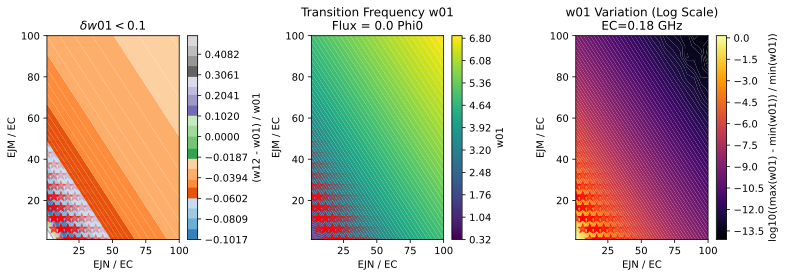

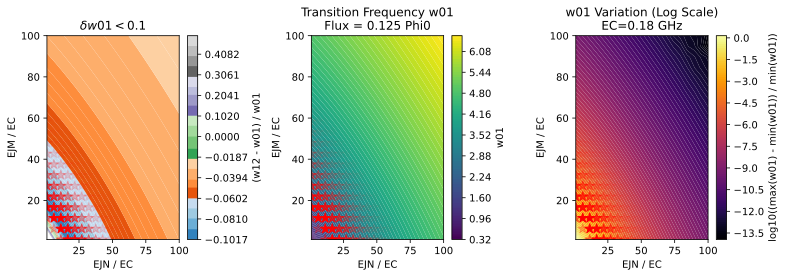

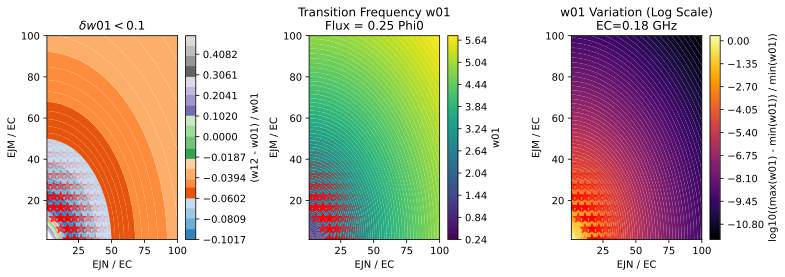

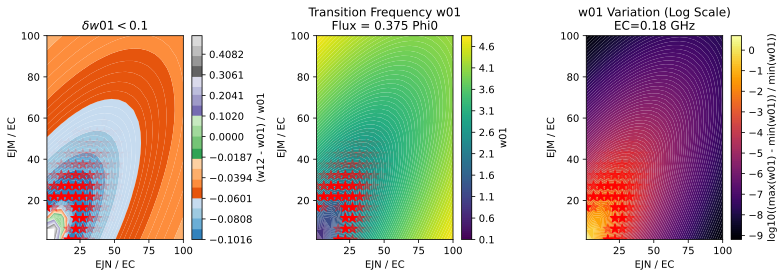

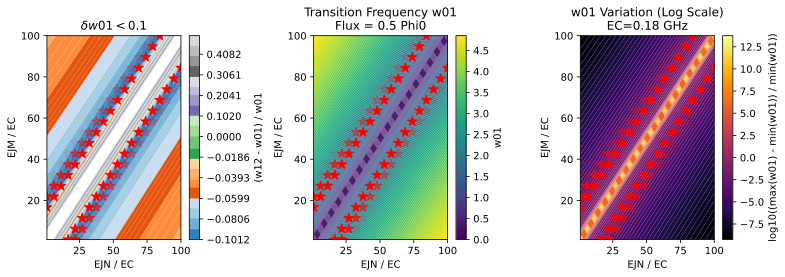

...

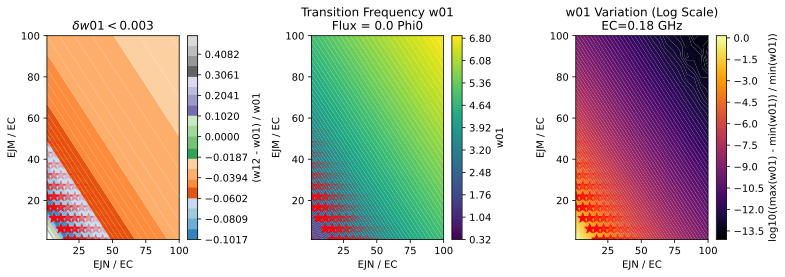

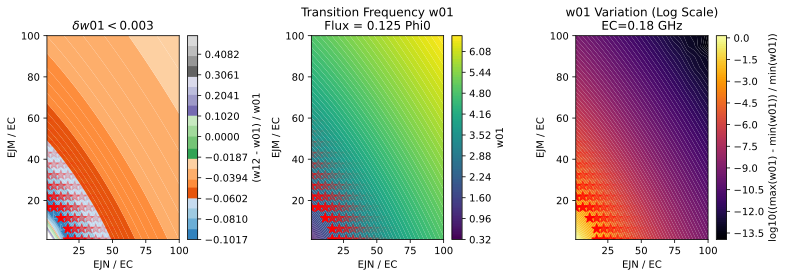

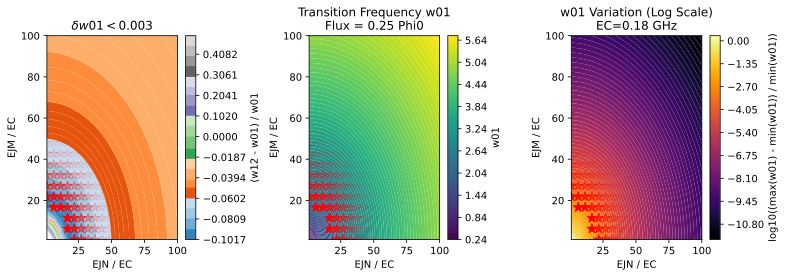

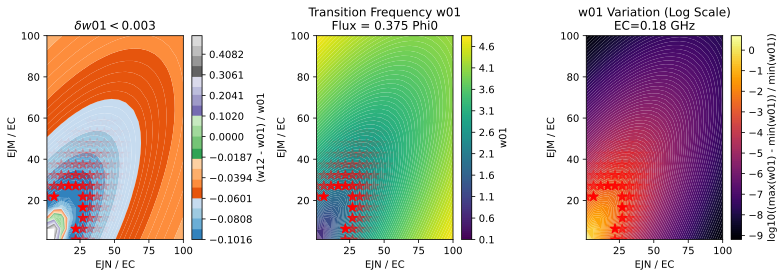

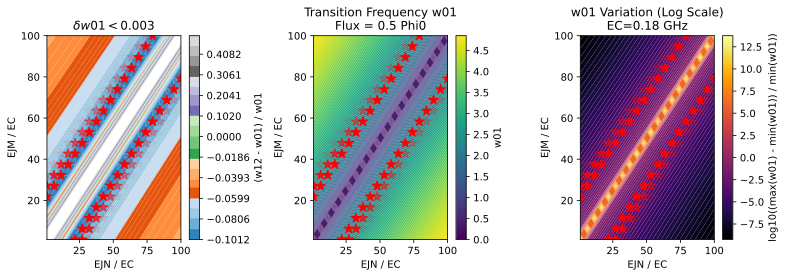

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

w01_variation_levels = [1e-1, 1e-2, 10**(-3)]

for w01_variation_lev in w01_variation_levels:

    for k, flux_value in enumerate(flux_list):

        EJN_grid, EJM_grid = np.meshgrid(EJN_list, EJM_list)

        # Extract arrays for the current flux value
        relative_anharm_list = relative_anharm_list_flux[:, :, k]
        w01_list = w01_list_flux[:, :, k]
        w01_variation_list = w01_variation_list_flux[:, :, k]

        # Replace NaN values in relative_anharm_list
        relative_anharm_list[np.isnan(relative_anharm_list)] = 1

        # Create DataFrame for all data points
        data = {
            'EJN': EJN_grid.flatten(),
            'EJM': EJM_grid.flatten(),
            'RelativeAnharmonicity': relative_anharm_list.flatten(),
            'w01': w01_list.flatten(),
            'w01Variation': w01_variation_list.flatten()
        }
        df = pd.DataFrame(data)

        # Filter rows where w01Variation < 10^(-1)
        filtered_df = df[df['w01Variation'] < w01_variation_lev]

        # Identify the top N_anharm points (lowest anharmonicity values)
        N_anharm = 100
        best_points = filtered_df.nsmallest(N_anharm, 'RelativeAnharmonicity')

        # Adjust alpha values for star-points
        best_anharm_values = best_points['RelativeAnharmonicity'].values
        alphas = np.ones(N_anharm)
        for i in range(1, N_anharm):
            if abs(best_anharm_values[i] - best_anharm_values[i - 1]) > 1e-3:
                alphas[i:] = np.logspace(0, -2, N_anharm - i)
                break

        # Plot with contourf and overlay star-points
        fig, axes = plt.subplots(1, 3, figsize=(11, 4))

        # First subplot: Relative Anharmonicity
        norm = colors.TwoSlopeNorm(vmin=df['RelativeAnharmonicity'].min(), vcenter=0, vmax=0.5)
        levels = np.concatenate((np.linspace(df['RelativeAnharmonicity'].min(), -1e-5, 50), 
                                np.linspace(0, 0.5, 50)))
        im1 = axes[0].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            relative_anharm_list, levels=levels, cmap='tab20c', norm=norm)
        fig.colorbar(im1, ax=axes[0], label='(w12 - w01) / w01')
        axes[0].set_title(r"$\delta w01 < {}$".format(round(w01_variation_lev, 3)))
        axes[0].set_xlabel('EJN / EC')
        axes[0].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[0].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Second subplot: w01
        im2 = axes[1].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            w01_list, levels=100, cmap='viridis')
        fig.colorbar(im2, ax=axes[1], label='w01')
        axes[1].set_title(f"Transition Frequency w01\nFlux = {flux_value} Phi0")
        axes[1].set_xlabel('EJN / EC')
        axes[1].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[1].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Third subplot: Log10 of w01 Variation
        im3 = axes[2].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            np.log10(w01_variation_list), levels=100, cmap='inferno')
        fig.colorbar(im3, ax=axes[2], label='log10((max(w01) - min(w01)) / min(w01))')
        axes[2].set_title(f"w01 Variation (Log Scale)\nEC={round(EC_shunt, 2)} GHz")
        axes[2].set_xlabel('EJN / EC')
        axes[2].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[2].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Adjust layout and save the figure
        plt.tight_layout()
        plt.savefig(f"./data_figures/N={N}_M={M}_EC={round(EC_shunt, 2)}_flux_{k}_combined_plots.pdf")
        plt.show()
